In [27]:
%matplotlib inline
import networkx  as nx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import netwulf as nw

In [28]:
G4 = nx.read_gpickle( '../../Files/Identifying_Subs/G4.pickle')

In [29]:
import json
file = open('../../Visualizations/Large_Post.txt', 'r')
config = json.load(file)
file.close()

In [30]:
import json
file = open('../../Visualizations/Large_Post_n.txt', 'r')
stylized_network = json.load(file)
file.close()

In [31]:
posts = pd.read_csv('/Users/jakobschlierf/Desktop/Master/Thesis/Files/Submissions/score/EDA_stats.csv')
# posts.rename(columns={'Unnamed: 0':'subreddit', 'posts_pro':'anti', 'posts_neutral': "pro", 'posts_anti':'neutral'}, inplace=True)

In [32]:
posts.rename(columns={'Unnamed: 0':'subreddit'}, inplace=True)

In [33]:
posts.head()

,subreddit,posts,Non-Covid,Covid,authors
0,altnewz,3651,2760,891,169
1,CovidIsACult,115,60,55,6
2,didnthappen,204,191,13,49
3,OpenTheSchools,39,23,16,12
4,punnychalkboards,258,252,6,31


In [34]:
import netwulf as nw
from collections import Counter
def plot_graph(G,
               edge_weight_key='weight',
               node_group_key = 'group',
               figsize = (15,15),
               config = None,
               savefig_name = None):
    
    
    # intialize the attributes to plot in color the partition 
    new_G = nw.get_filtered_network(G, edge_weight_key= edge_weight_key, node_group_key = node_group_key)
    stylized_network, new_config = nw.visualize(new_G, config = config, plot_in_cell_below = False, is_test=False) 
    
    # save the position of the nodes in a (x,y) format
    pos = { n: np.array(nw.tools.node_pos(stylized_network, n)) for n in G.nodes() if n!= np.nan}
    #save node colors
    col = { n['id']: n['color']  for n in stylized_network['nodes'] }

    #save edge width
    weight_map = { s['weight']: s['width'] for s in stylized_network['links']}


    fig, axes = plt.subplots(figsize = figsize)
    nw.draw_netwulf(stylized_network, fig = fig, ax = axes ,figsize = figsize, draw_nodes = True, draw_links=False)
    dir_G = nx.from_pandas_edgelist(nx.to_pandas_edgelist(new_G), edge_attr=True, create_using= nx.DiGraph)
    edge_colors = [
                col[source] if col[source] == col[target] else "gray"
                for source,target in dir_G.edges()]
    edges_width = [2*weight_map[w] for w in dict(nx.get_edge_attributes(dir_G,'weight')).values()]

    nx.draw_networkx_edges(dir_G,
                       pos,
                       width = edges_width,
                       edge_color=edge_colors,
                       alpha = 0.3,
                       ax=axes,
                       connectionstyle=f'arc3, rad = .1',
                       arrowstyle = '-'
                       )
    # create label for eache node, with the size proportional to the degree of the node
    for node_style in stylized_network['nodes']:

        label = node_style['id']
        x,y  = nw.tools.node_pos(stylized_network, label)
        size = .5+ 4*np.log(node_style['radius'])
        

        axes.text(x,y,label, size =size,
                  horizontalalignment='center',
                  verticalalignment='center', zorder = 1000)
        
    # save figure if you like
    if savefig_name is not None:
        plt.savefig(f'{savefig_name}.pdf', bbox_inches = 'tight')
            
    return stylized_network, new_config

################################################################

# FIND COMMUNIY STRUCTURE
from community import community_louvain

# function to find communities
def find_communities(G, weight = 'weight'):

    # compute the best partition
    partition = community_louvain.best_partition(G, weight = weight)

    # modularity
    mod = community_louvain.modularity(partition, G, weight = weight)
    
    # save partition in the graph
    nx.set_node_attributes(G, partition, 'group')
    
    print(f" Modularity: {round(mod, 3)} \n Communities: {len(Counter(partition.values()))}")
    
    return partition, mod

# Classifier I

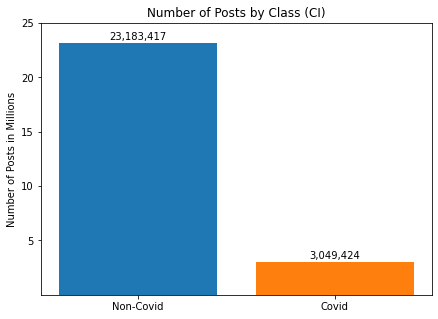

In [35]:
def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i, (y[i] + 250000), "{:,}".format(y[i]), ha = 'center')
plt.figure(figsize=(7,5))
x = ['Non-Covid', 'Covid']
y = posts[['Non-Covid', 'Covid']].sum()
# posts[['Non-Covid', 'Covid']].sum().plot(kind="bar", title="Number of Posts per CI Sentiment in Millions",  )
plt.title("Number of Posts by Class (CI)")
plt.bar(x, y, width=0.8, color=['tab:blue','tab:orange'])
addlabels(x, y)
plt.xticks(rotation=0)
plt.yticks(ticks=[5000000, 10000000, 15000000, 20000000, 25000000], labels=[5, 10, 15, 20, 25 ])
plt.ylabel("Number of Posts in Millions")

plt.savefig("../../Visualizations/RQ1/C1_counts.pdf", bbox_inches = 'tight')


In [36]:
posts['p_cd_ratio'] = posts['Covid'] / posts['posts']
posts['p_nc_ratio'] = posts['Non-Covid'] / posts['posts']

In [37]:
posts2.sort_values(by='p_an_ratio', ascending=False).head(10)

,subreddit,posts,posts_anti,posts_neutral,posts_pro,authors,p_pr_ratio,p_ne_ratio,p_an_ratio
225,QAnonCasualties,8029,6396,1463,170,6096,0.021173,0.182214,0.796612
18,The_Ultimate,78,59,19,0,2,0.000000,0.243590,0.756410
223,TIHI,4346,2999,1328,19,3833,0.004372,0.305568,0.690060
21,CovidVaccineInjury,632,423,79,130,111,0.205696,0.125000,0.669304
57,TrueAntiVaccination,2721,1819,301,601,350,0.220875,0.110621,0.668504
35,vacci_nation,1269,828,214,227,78,0.178881,0.168637,0.652482
58,TakeTheJab,2977,1912,471,594,340,0.199530,0.158213,0.642257
64,antivax,2480,1574,214,692,1840,0.279032,0.086290,0.634677
110,AutisticPride,1304,779,455,70,929,0.053681,0.348926,0.597393
166,JustUnsubbed,1207,705,479,23,1055,0.019056,0.396852,0.584093


In [38]:
posts2.sort_values(by='p_pr_ratio', ascending=False).head(10)

,subreddit,posts,posts_anti,posts_neutral,posts_pro,authors,p_pr_ratio,p_ne_ratio,p_an_ratio
197,CovidVaccinated,24113,7771,1036,15306,17022,0.634761,0.042964,0.322274
71,VACCINES,3755,1691,183,1881,2965,0.500932,0.048735,0.450333
52,VaccineDiscussion,1816,1008,126,682,1105,0.375551,0.069383,0.555066
64,antivax,2480,1574,214,692,1840,0.279032,0.086290,0.634677
142,DebateVaccines,13420,7700,2264,3456,2523,0.257526,0.168703,0.573770
13,AmericanPandemics,434,78,245,111,5,0.255760,0.564516,0.179724
20,conspiracyhub,410,208,107,95,17,0.231707,0.260976,0.507317
15,NotoQanon,79,9,52,18,3,0.227848,0.658228,0.113924
72,PBS_NewsHour,1474,111,1030,333,3,0.225916,0.698779,0.075305
57,TrueAntiVaccination,2721,1819,301,601,350,0.220875,0.110621,0.668504


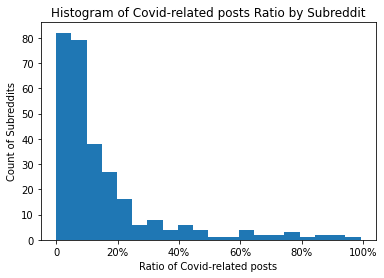

In [39]:
posts[['p_cd_ratio']].plot( kind='hist', bins = 20, legend=False)
plt.ylabel('Count of Subreddits')
plt.xlabel('Ratio of Covid-related posts')
plt.xticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1], labels=[0, '20%', '40%', '60%', '80%', '100%'])
plt.title('Histogram of Covid-related posts Ratio by Subreddit')
plt.savefig("../../Visualizations/RQ1/C1_sub_hist.pdf", bbox_inches = 'tight')

In [40]:
cd_r_dict = pd.Series(posts['p_cd_ratio'].values, index=posts.subreddit).to_dict()

In [41]:
nx.set_node_attributes(G4, cd_r_dict, 'cov_rel',)

In [42]:
# remove node if it does not have the attribute 'cov_rel'
G4.remove_nodes_from([n for n in G4.nodes() if 'cov_rel' not in G4.nodes[n]])
Gcc = G4.subgraph(sorted(nx.connected_components(G4), key=len, reverse=True)[0])

In [130]:
G6 = Gcc.copy()

In [131]:
G6.remove_edge('conspiracy', 'NEWPOLITIC')

In [132]:
G7 = G6.subgraph(sorted(nx.connected_components(G6), key=len, reverse=True)[1])

In [411]:
subcluster = list(G7.nodes())

In [413]:
with open('../../Files/Submissions/score/done/subcluster.txt', 'w') as f:
    for item in subcluster:
        f.write(item + '\n')
subcluster

['DebateVaccines',
 'CovidVaccineInjury',
 'VaccineDiscussion',
 'AncientTruehistory',
 'conspiracyNOPOL',
 'TopMindsOfReddit',
 'NoNewNormal',
 'TakeTheJab',
 'NoLockdownsNoMasks',
 'VACCINES',
 'conspiracyhub',
 'ConspiracyUltra',
 'altnewz',
 'NoNoNewNormal',
 'NoNewNormalBan',
 'noagenda',
 'antivax',
 'conspiracies',
 'CovidVaccinated',
 'CovidIsACult',
 'vacci_nation',
 'conspiracy',
 'TrueAntiVaccination']

In [239]:
# config = None

partition, mod = find_communities(G7 )

 Modularity: 0.41 
 Communities: 3


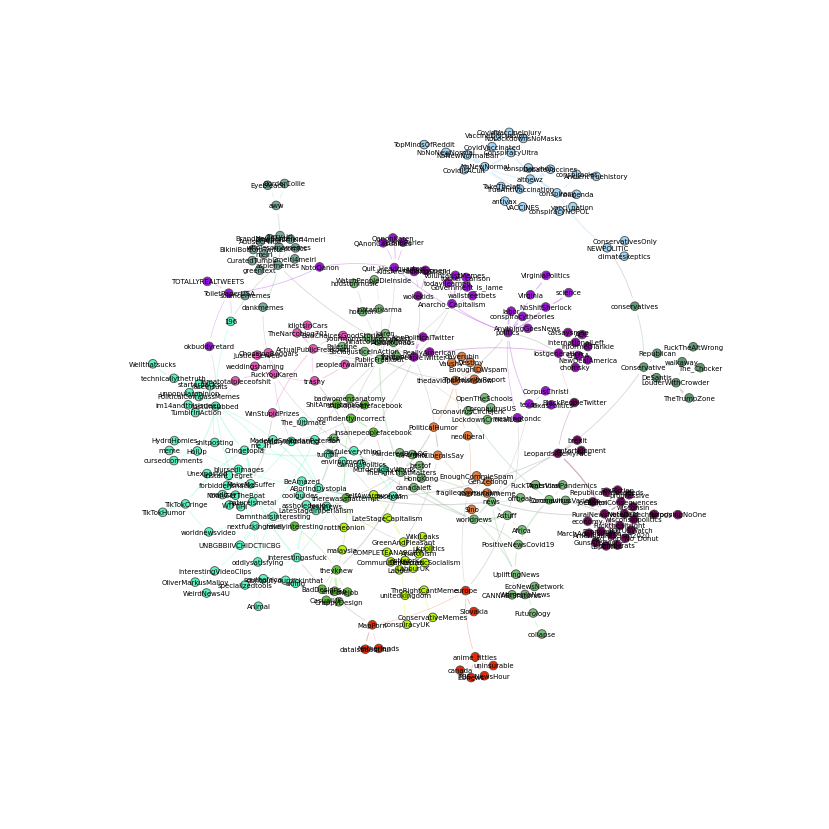

In [193]:
stylized_network, config = plot_graph(Gcc,
                                      config = None,
                                      edge_weight_key='weight',
                                      node_group_key=None,
                                      savefig_name = "../../Visualizations/RQ1/Large_post")

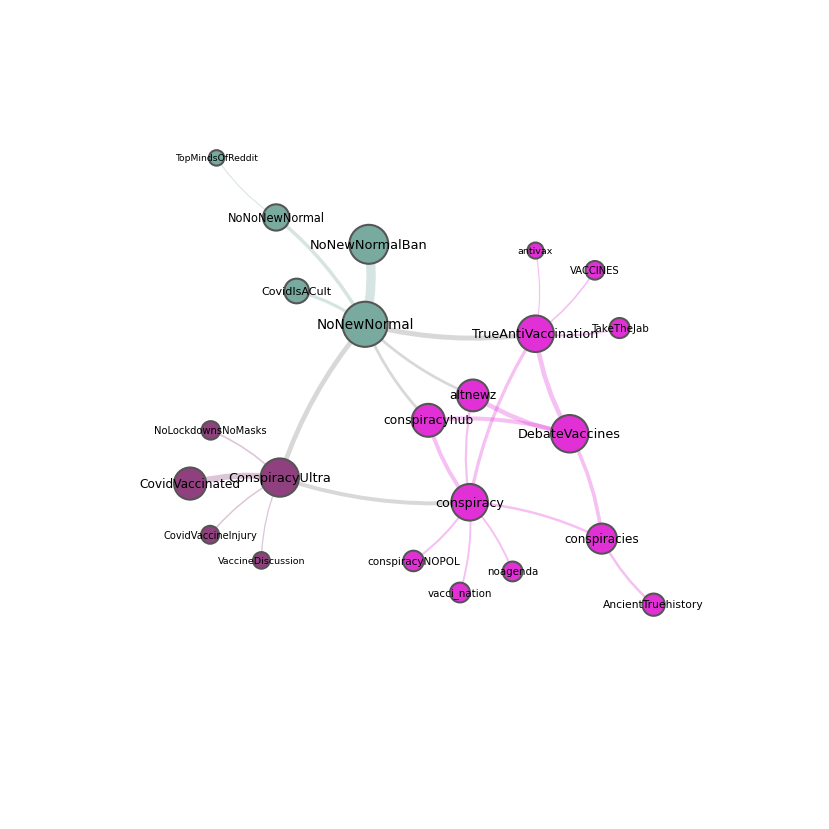

In [240]:
stylized_network, config = plot_graph(G7,
                                      config = config,
                                      edge_weight_key='weight',
                                      savefig_name = "../../Visualizations/RQ1/Cluster_post")

In [95]:
# colors = ['#1b9e77','#7570b3','#d95f02']
# colors = ['#1b9e77','purple','#d95f02']
colors = ['lightblue', '#d95f02', 'bisque']


def drawPieMarker(xs, ys, ratios, sizes, colors):
    assert sum(ratios) <= 1, 'sum of ratios needs to be < 1'

    markers = []
    previous = 0
    # calculate the points of the pie pieces
    for color, ratio in zip(colors, ratios):
        this = 2 * np.pi * ratio + previous
        x  = [0] + np.cos(np.linspace(previous, this, 50)).tolist() + [0]
        y  = [0] + np.sin(np.linspace(previous, this, 50)).tolist() + [0]
        xy = np.column_stack([x, y])
        previous = this
        markers.append({'marker':xy, 's':np.abs(xy).max()**2*np.array(sizes), 'facecolor':color, 'edgecolor': 'k', 'linewidth':.3})

    # scatter each of the pie pieces to create pies
    for marker in markers:
        ax.scatter(xs, ys, **marker)
        

pos = { n: np.array(nw.tools.node_pos(stylized_network, n)) for n in Gcc.nodes() if n!= np.nan}

In [64]:
vax_count = pd.DataFrame(np.random.randint(10, size=(len(G7.nodes()), 3)),
                         columns = ['pro', 'anti', 'neutral'], index = G7.nodes())

vax_count['total_count'] = vax_count.sum(axis =1)
vax_count

,pro,anti,neutral,total_count
NoNewNormal,5,0,2,7
ConspiracyUltra,9,5,1,15
altnewz,2,9,1,12
TrueAntiVaccination,7,2,3,12
CovidVaccineInjury,5,2,2,9
conspiracyNOPOL,0,0,1,1
conspiracies,6,3,6,15
CovidVaccinated,6,1,5,12
CovidIsACult,3,5,3,11
NoNewNormalBan,3,8,0,11


In [65]:
posts.head()

,subreddit,posts,Non-Covid,Covid,authors,p_cd_ratio,p_nc_ratio
0,altnewz,3651,2760,891,169,0.244043,0.755957
1,CovidIsACult,115,60,55,6,0.478261,0.521739
2,didnthappen,204,191,13,49,0.063725,0.936275
3,OpenTheSchools,39,23,16,12,0.410256,0.589744
4,punnychalkboards,258,252,6,31,0.023256,0.976744


In [110]:
# colors = ['#1b9e77','#7570b3','#d95f02']
# colors = ['#1b9e77','purple','#d95f02']
colors = ['tab:orange', 'tab:blue']
colors2 = ['green', 'tab:blue', 'red']

def drawPieMarker(xs, ys, ratios, sizes, colors):
    assert sum(ratios) <= 1, 'sum of ratios needs to be < 1'

    markers = []
    previous = 0
    # calculate the points of the pie pieces
    for color, ratio in zip(colors, ratios):
        this = 2 * np.pi * ratio + previous
        x  = [0] + np.cos(np.linspace(previous, this, 50)).tolist() + [0]
        y  = [0] + np.sin(np.linspace(previous, this, 50)).tolist() + [0]
        xy = np.column_stack([x, y])
        previous = this
        markers.append({'marker':xy, 's':np.abs(xy).max()**2*np.array(sizes), 'facecolor':color, 'edgecolor': 'k', 'linewidth':.3})

    # scatter each of the pie pieces to create pies
    for marker in markers:
        ax.scatter(xs, ys, **marker)
        

pos = { n: np.array(nw.tools.node_pos(stylized_network, n)) for n in Gcc.nodes() if n!= np.nan}

In [111]:
cov_count_pct = posts[['subreddit', 'p_cd_ratio', 'p_nc_ratio']].set_index('subreddit')

In [112]:
cov_count = posts[['subreddit','posts']].set_index('subreddit')

In [113]:
cov_count_pct = cov_count_pct.loc[list(Gcc.nodes())]
cov_count = cov_count.loc[list(Gcc.nodes())]

p_cd_ratio    0.021046
p_nc_ratio    0.978954
Name: dankmemes, dtype: float64


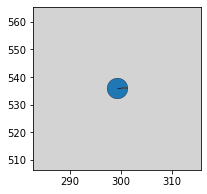

In [114]:
node = 'dankmemes'
print(cov_count_pct.loc[node])
x, y = pos[node]
size = np.log(cov_count.loc[node,'posts'])

      
      

fig, ax = plt.subplots(1,1, figsize=(3,3))
ax.set_facecolor('lightgray')
drawPieMarker(xs=x,
            ys=y,
            ratios= cov_count_pct.loc[node],
            sizes=30 * np.array([size]),
            colors=colors) 

In [123]:
from sklearn.preprocessing import MinMaxScaler
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
scale = MinMaxScaler(feature_range=(200,1000 ))
scale.fit(np.array(cov_count['posts']).reshape(-1,1))

def addlabels(x,y,offset=0):
    for i in range(len(x)):
        plt.text((i+ offset), (y[i] + 10), y[i], ha = 'center', rotation = 0)

In [116]:
np.array(cov_count.loc[node,'posts']).reshape(-1, 1)

array([[1477996]])

In [104]:
top_names = list(cov_count_pct.sort_values(by='p_cd_ratio', ascending=False)[0:50].index.values)

In [184]:
res_names = list(set([node for (node, val) in Gcc.degree() if val > 1]) - set(top_names))

In [180]:
deg = [node for (node, val) in Gcc.degree() if val > 1]

In [186]:
len(res_names)

61

In [181]:
len(deg)

100

In [195]:
from adjustText import adjust_text

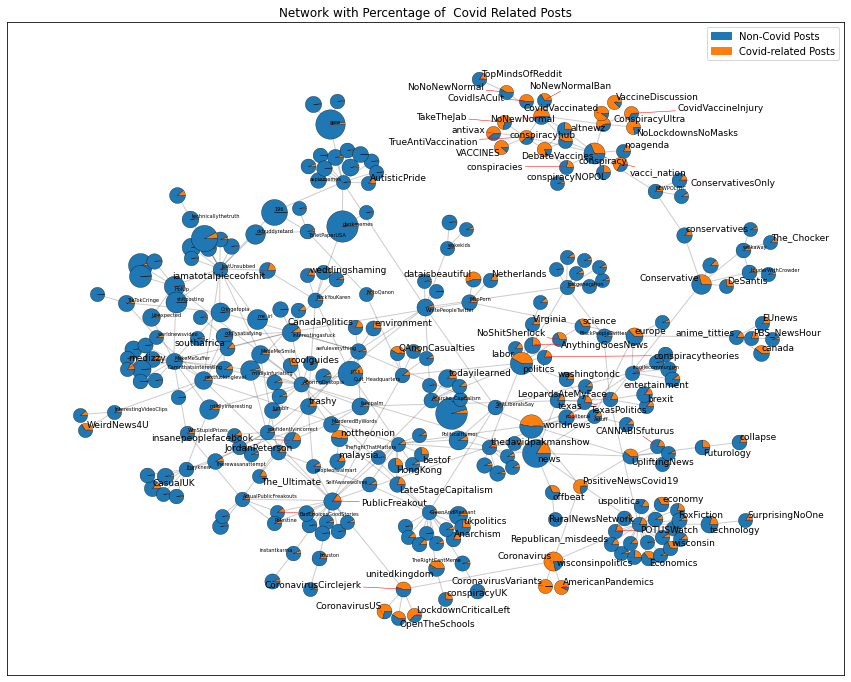

In [209]:

fig, ax = plt.subplots(figsize = (15,12))
nx.draw_networkx_edges(Gcc,
                    pos,
                    alpha = 0.2,
                    )
ax.set_facecolor('white')
for node in list(Gcc.nodes()):
    x, y = pos[node]
    size = scale.transform(np.array(cov_count.loc[node,'posts']).reshape(-1, 1) )
    
    drawPieMarker(xs=x,
                ys=y,
                ratios= cov_count_pct.loc[node],
                sizes=  np.array(size),
                colors=colors)    

text = []
for node in top_names:
    x, y = pos[node]
    t = plt.text(x, y, node, ha = 'center', rotation = 0, fontsize = 9)
    text.append(t)

for node in res_names:
    x, y = pos[node]
    t = plt.text(x, y, node, ha = 'center', rotation = 0, fontsize = 5)
    text.append(t)

plt.axis()
bl_patch = mpatches.Patch(color='tab:blue', label='Non-Covid Posts')
or_patch = mpatches.Patch(color='tab:orange', label='Covid-related Posts')
plt.legend(handles=[bl_patch, or_patch], loc = 'upper right')
plt.title('Network with Percentage of  Covid Related Posts')
it = adjust_text(text, arrowprops=dict(arrowstyle="-", color='r', lw=0.5))
plt.savefig('../../Visualizations/RQ1/C1_network.pdf', bbox_inches = 'tight')

In [225]:
it

500

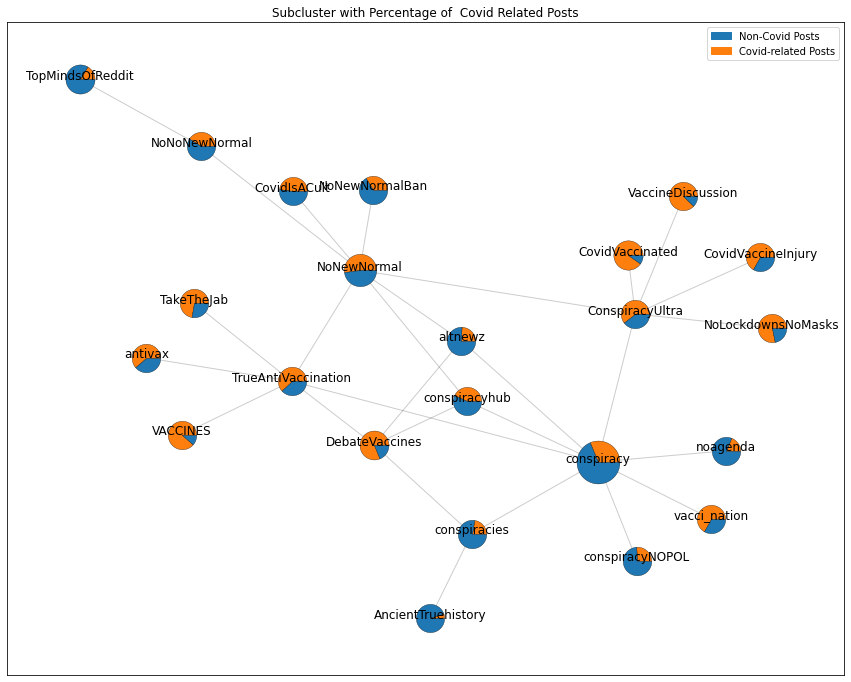

In [173]:
fig, ax = plt.subplots(figsize = (15,12))
nx.draw_networkx_edges(G7,
                    pos,
                    alpha = 0.2,
                    )
ax.set_facecolor('white')
for node in list(G7.nodes()):
    x, y = pos[node]
    size = scale2.transform(np.array(cov_count.loc[node,'posts']).reshape(-1, 1))
    
    drawPieMarker(xs=x,
                ys=y,
                ratios= cov_count_pct.loc[node],
                sizes=  np.array(size),
                colors=colors)    

for node in list(G7.nodes()):
    x, y = pos[node]
    plt.text(x, y, node, ha = 'center', rotation = 0, fontsize = 12)
plt.axis()
bl_patch = mpatches.Patch(color='tab:blue', label='Non-Covid Posts')
or_patch = mpatches.Patch(color='tab:orange', label='Covid-related Posts')
plt.legend(handles=[bl_patch, or_patch], loc = 'upper right')
plt.title('Subcluster with Percentage of  Covid Related Posts')
plt.savefig('../../Visualizations/RQ1/C1_subcluster.pdf', bbox_inches = 'tight')

### Old Scored Network

Text(0.5, 1.0, 'Network of Subreddits with Color Coded by Percentage of Covid-related Posts')

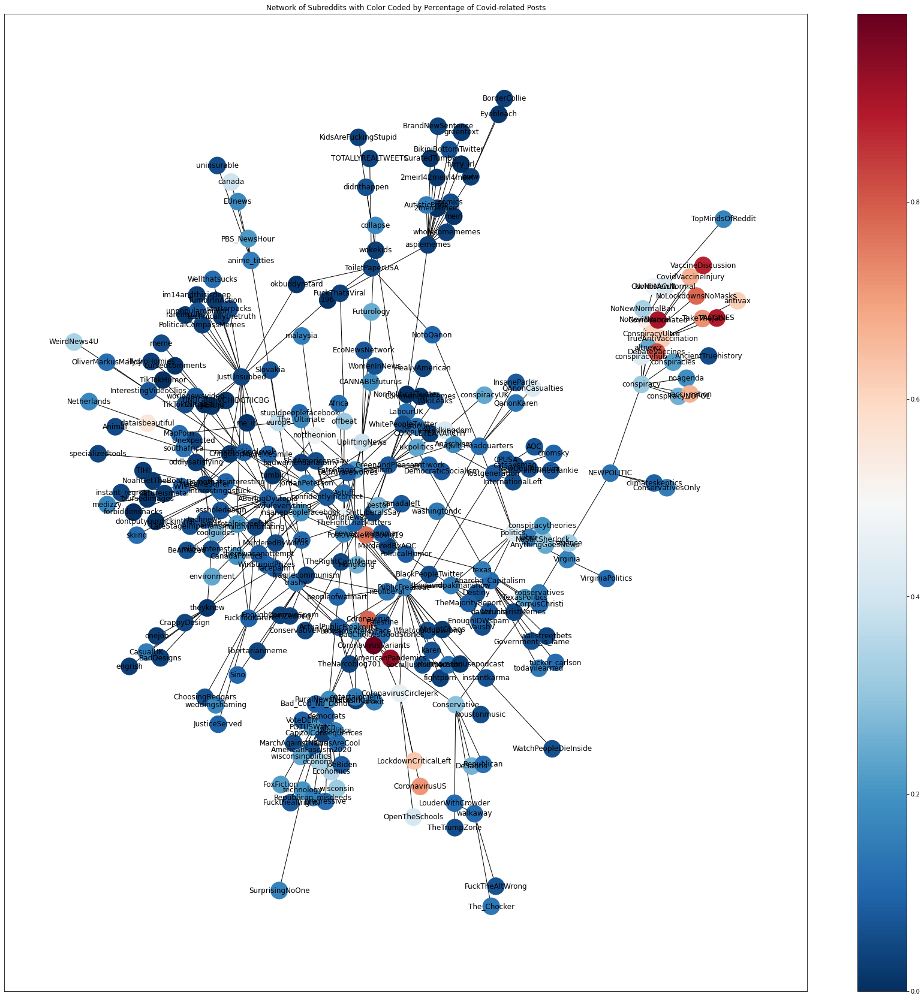

In [ ]:
plt.figure(figsize=(30, 30))
ATTRIBUTE_NAME = 'cov_rel'
COLOR_SCHEME = "RdBu_r" # try plt.cm.Blues if your attribute is a continuous variable
Gcc = G4.subgraph(sorted(nx.connected_components(G4), key=len, reverse=True)[0])
colors = [Gcc.nodes[node][ATTRIBUTE_NAME] for node in list(Gcc.nodes())]
pos = nx.spring_layout(Gcc, seed=10396953)
# nx.draw_networkx_nodes(Gcc, pos, node_size=10, node_color=colors, cmap=COLOR_SCHEME, label=Gcc.nodes())
# nx.draw_networkx_edges(Gcc, pos, alpha=0.4)
nx.draw_networkx(Gcc, pos, node_color=colors, node_size=800, cmap=COLOR_SCHEME)
ax=plt.gca()
PCM=ax.get_children()[0] # this index may vary
plt.colorbar(PCM, ax=ax)
plt.title("Network of Subreddits with Color Coded by Percentage of Covid-related Posts")

In [ ]:
stylized_network, config = nw.visualize(Gcc)

In [ ]:
nw.visualize(Gcc, config=config)

(None, None)

In [ ]:
posts.sort_values(by='p_cd_ratio', ascending=False).head(20)

,subreddit,posts,Non-Covid,Covid,authors,p_cd_ratio,p_nc_ratio
10,CoronavirusVariants,437,4,433,7,0.990847,0.009153
13,AmericanPandemics,466,32,434,5,0.931330,0.068670
197,CovidVaccinated,26721,2608,24113,18371,0.902399,0.097601
71,VACCINES,4236,481,3755,3348,0.886449,0.113551
52,VaccineDiscussion,2068,252,1816,1207,0.878143,0.121857
142,DebateVaccines,16515,3095,13420,2954,0.812595,0.187405
273,Coronavirus,316400,68065,248335,85729,0.784877,0.215123
46,NoLockdownsNoMasks,2611,571,2040,47,0.781310,0.218690
31,PositiveNewsCovid19,1651,390,1261,3,0.763780,0.236220
58,TakeTheJab,4120,1143,2977,447,0.722573,0.277427


In [ ]:
G7 = Gcc.copy()

In [ ]:
G7.remove_edge("NEWPOLITIC", "conspiracy")

In [ ]:
t = sorted(nx.connected_components(G7), key=len, reverse=True)

In [ ]:
l = t[1]

In [ ]:
l = list(l)

In [ ]:
l.sort()

In [ ]:
len(l)

23

# Classifier II

In [16]:
posts2 = pd.read_csv('/Users/jakobschlierf/Desktop/Master/Thesis/Files/Submissions/score/done/EDA_stats.csv')

In [17]:
posts2.head()

,Unnamed: 0,posts,posts_anti,posts_neutral,posts_pro,authors
0,altnewz,891,277,463,151,72
1,CovidIsACult,55,5,46,4,4
2,didnthappen,13,4,8,1,3
3,OpenTheSchools,16,1,14,1,6
4,punnychalkboards,6,1,5,0,3


In [18]:
posts2.rename(columns={'Unnamed: 0':'subreddit'}, inplace=True)

In [19]:
posts2[['posts', 'posts_anti', 'posts_neutral', 'posts_pro']].sum()

posts            2982155
posts_anti        421328
posts_neutral    2364642
posts_pro         196185
dtype: int64

In [29]:
tiktok = pd.read_pickle('../../Files/Submissions/score/done/d_TikTokHumor.pickle')

In [30]:
tiktok.groupby(by='class_II').count()

,author,created_utc,id,num_comments,permalink,score,selftext,subreddit,title,url,cleanTitle,text,cleanText,class_I,conf_I,label_0,label_1,label_2,conf_II
class_II,,,,,,,,,,,,,,,,,,,
0,373,373,373,373,373,373,373,373,373,373,373,373,373,373,373,373,373,373,373
1,8150,8150,8150,8150,8150,8150,8150,8150,8150,8150,8150,8150,8150,8150,8150,8150,8150,8150,8150
2,24,24,24,24,24,24,24,24,24,24,24,24,24,24,24,24,24,24,24


In [ ]:
373 + 8150 + 24

8547

In [21]:
posts2.at[66, 'posts'] = 8547
posts2.at[66, 'posts_anti'] = 373
posts2.at[66, 'posts_neutral'] = 8150
posts2.at[66, 'posts_pro'] = 24

In [22]:
posts2[posts2['subreddit'] == 'TikTokHumor']

,subreddit,posts,posts_anti,posts_neutral,posts_pro,authors
66,TikTokHumor,8547,373,8150,24,0


In [23]:
posts2['p_pr_ratio'] = posts2['posts_pro'] / posts2['posts']
posts2['p_ne_ratio'] = posts2['posts_neutral'] / posts2['posts']
posts2['p_an_ratio'] = posts2['posts_anti'] / posts2['posts']

In [24]:
vax_count = posts2[['subreddit','posts']].set_index('subreddit')

In [155]:
vax_count_pct = posts2[['subreddit', 'p_pr_ratio', 'p_ne_ratio', 'p_an_ratio']].set_index('subreddit')

In [156]:
vax_count_pct.sum(axis=1).min()

0.9999999999999999

In [166]:
Gcc2 = Gcc.copy()
Gcc2.remove_node('wallstreetbets')
vax_count_pct = vax_count_pct.loc[list(Gcc2.nodes())]
vax_count = vax_count.loc[list(Gcc2.nodes())]

In [144]:
vax_count_pct = vax_count_pct.loc[list(G7.nodes())]
vax_count = vax_count.loc[list(G7.nodes())]

p_pr_ratio    0.118090
p_ne_ratio    0.447338
p_an_ratio    0.434572
Name: NoNewNormal, dtype: float64


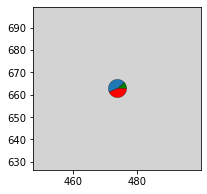

In [167]:
node = 'NoNewNormal'
print(vax_count_pct.loc[node])
x, y = pos[node]
size = np.log(vax_count.loc[node,'posts'])

      
      

fig, ax = plt.subplots(1,1, figsize=(3,3))
ax.set_facecolor('lightgray')
drawPieMarker(xs=x,
            ys=y,
            ratios= vax_count_pct.loc[node],
            sizes=30 * np.array([size]),
            colors=colors2) 

In [168]:
top_names2 = list(vax_count_pct.sort_values(by='p_an_ratio', ascending=False)[0:30].index.values)

In [169]:
res_names2 = list(set(vax_count_pct.index.values) - set(top_names2))

In [232]:
res_names2 = list(set([node for (node, val) in Gcc.degree() if val > 1]) - set(top_names2))

In [160]:
scale2 = MinMaxScaler(feature_range=(800,2500 ))
scale2.fit(np.array(vax_count['posts']).reshape(-1,1))

MinMaxScaler(feature_range=(800, 1500))

In [236]:
len(top_names2)

30

In [157]:
vax_count_pct.loc['FuckYouKaren'].sum()

1.0

In [158]:
vax_count_pct.loc['TikTokHumor']

p_pr_ratio    0.002808
p_ne_ratio    0.953551
p_an_ratio    0.043641
Name: TikTokHumor, dtype: float64

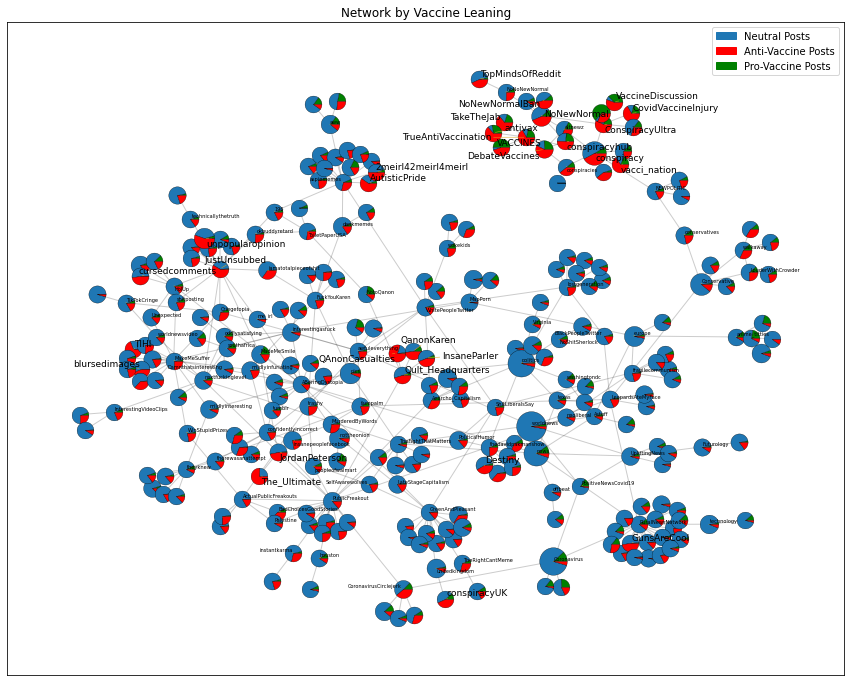

In [237]:
fig, ax = plt.subplots(figsize = (15,12))
nx.draw_networkx_edges(Gcc2,
                    pos,
                    alpha = 0.2,
                    )
ax.set_facecolor('white')
for node in list(Gcc2.nodes()):
    x, y = pos[node]
    size = scale2.transform(np.array(vax_count.loc[node,'posts']).reshape(-1, 1) )
    
    drawPieMarker(xs=x,
                ys=y,
                ratios= vax_count_pct.loc[node],
                sizes= np.array(size) + 80,
                colors=colors2)    
texts2 = []
for node in top_names2:
    x, y = pos[node]
    t = plt.text(x, y, node, ha = 'center', rotation = 0, fontsize = 9)
    texts2.append(t)

for node in res_names2:
    x, y = pos[node]
    t = plt.text(x, y, node, ha = 'center', rotation = 0, fontsize = 5)
    texts2.append(t)
plt.axis()
bl_patch = mpatches.Patch(color='tab:blue', label='Neutral Posts')
re_patch = mpatches.Patch(color='red', label='Anti-Vaccine Posts')
gr_patch = mpatches.Patch(color='green', label='Pro-Vaccine Posts')
plt.legend(handles=[bl_patch, re_patch,  gr_patch], loc = 'upper right')
plt.title('Network by Vaccine Leaning')
it = adjust_text(texts2, arrowprops=dict(arrowstyle="-", color='goldenrod', lw=0.5))
plt.savefig('../../Visualizations/RQ1/C2_network.pdf', bbox_inches='tight')

In [229]:
it

23

In [214]:
l = []
for i in list(G7.nodes()):

    l.append(vax_count.loc[i,'posts'])

In [213]:
l

56948

In [223]:
scale3 = MinMaxScaler(feature_range=(400,3500 ))
scale3.fit(np.array(l).reshape(-1,1))

MinMaxScaler(feature_range=(400, 3500))

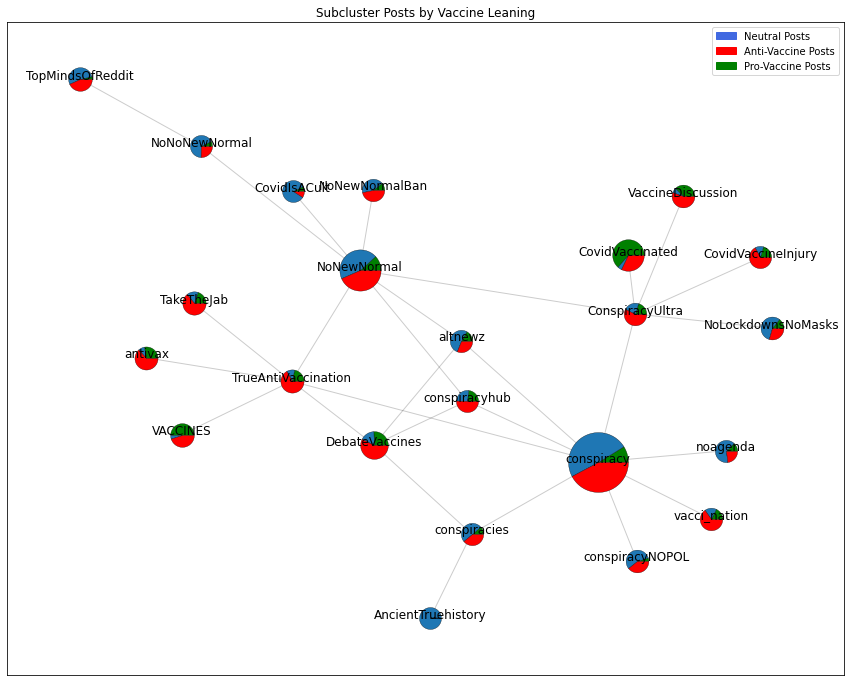

In [224]:
fig, ax = plt.subplots(figsize = (15,12))
nx.draw_networkx_edges(G7,
                    pos,
                    alpha = 0.2,
                    )
ax.set_facecolor('white')
for node in list(G7.nodes()):
    x, y = pos[node]
    size = scale3.transform(np.array(vax_count.loc[node,'posts']).reshape(-1, 1) )
    
    drawPieMarker(xs=x,
                ys=y,
                ratios= vax_count_pct.loc[node],
                sizes= np.array(size) + 80,
                colors=colors2)    

for node in list(G7.nodes()):
    x, y = pos[node]
    plt.text(x, y, node, ha = 'center', rotation = 0, fontsize = 12)
plt.axis()
bl_patch = mpatches.Patch(color='royalblue', label='Neutral Posts')
re_patch = mpatches.Patch(color='red', label='Anti-Vaccine Posts')
gr_patch = mpatches.Patch(color='green', label='Pro-Vaccine Posts')
plt.legend(handles=[bl_patch, re_patch,  gr_patch], loc = 'upper right')
plt.title('Subcluster Posts by Vaccine Leaning')
plt.savefig('../../Visualizations/RQ1/C2_subcluster.pdf', bbox_inches='tight')

In [58]:
len(list(G7.nodes()))

23

In [190]:
scale2 = MinMaxScaler(feature_range=(200,800 ))
scale2.fit(np.array(vax_count['posts']).reshape(-1,1))

MinMaxScaler(feature_range=(200, 800))

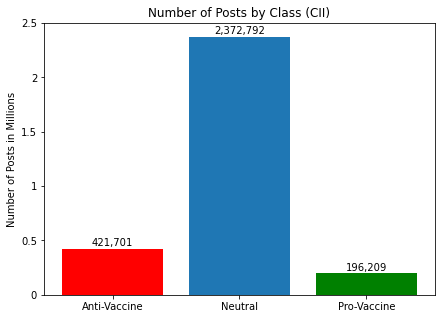

In [26]:
def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i, (y[i] + 25000), "{:,}".format(y[i]), ha = 'center')

plt.figure(figsize=(7,5))
x = ['Anti-Vaccine', 'Neutral', 'Pro-Vaccine']
y = posts2[['posts_anti', 'posts_neutral', 'posts_pro']].sum()
# posts2[['posts_anti', 'posts_neutral', 'posts_pro']].sum().plot(kind="bar", title="Number of Posts per Sentiment in Millions")
plt.bar(x, y, width=0.8, color=['red', 'tab:blue', 'green'])
addlabels(x, y)
plt.title("Number of Posts by Class (CII)")
plt.yticks(ticks=[0, 500000, 1000000, 1500000, 2000000, 2500000], labels=[0, 0.5, 1, 1.5, 2, 2.5])
plt.xticks(rotation=0)
plt.ylabel("Number of Posts in Millions")
plt.savefig("../../Visualizations/RQ1/C2_counts.pdf", bbox_inches='tight')


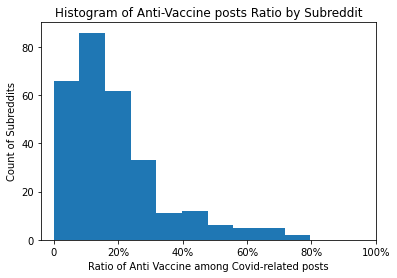

In [42]:
posts2[['p_an_ratio']].plot( kind='hist',  legend=False)
plt.ylabel('Count of Subreddits')
plt.xlabel('Ratio of Anti Vaccine among Covid-related posts')
plt.xticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1], labels=[0, '20%', '40%', '60%', '80%', '100%'])
plt.title('Histogram of Anti-Vaccine posts Ratio by Subreddit')
plt.savefig("../../Visualizations/RQ1/C2_ratio.pdf", bbox_inches='tight')


Text(0.5, 1.0, 'Histogram of Pro-Vaccine posts Ratio by Subreddit')

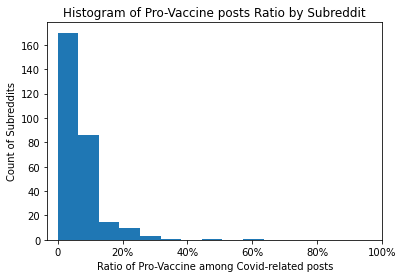

In [198]:
posts2[['p_pr_ratio']].plot( kind='hist',  legend=False)
plt.ylabel('Count of Subreddits')
plt.xlabel('Ratio of Pro-Vaccine among Covid-related posts')
plt.xticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1], labels=[0, '20%', '40%', '60%', '80%', '100%'])
plt.title('Histogram of Pro-Vaccine posts Ratio by Subreddit')

Text(0.5, 1.0, 'Histogram of Neutral posts Ratio by Subreddit')

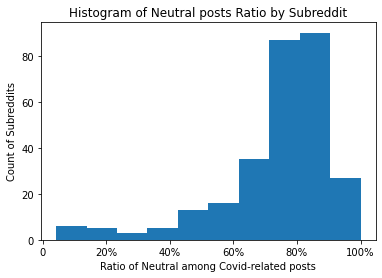

In [199]:
posts2[['p_ne_ratio']].plot( kind='hist',  legend=False)
plt.ylabel('Count of Subreddits')
plt.xlabel('Ratio of Neutral among Covid-related posts')
plt.xticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1], labels=[0, '20%', '40%', '60%', '80%', '100%'])
plt.title('Histogram of Neutral posts Ratio by Subreddit')

In [331]:
p_an_dict = pd.Series(posts2['p_an_ratio'].values, index=posts2.subreddit).to_dict()
p_pr_dict = pd.Series(posts2['p_pr_ratio'].values, index=posts2.subreddit).to_dict()
p_ne_dict = pd.Series(posts2['p_ne_ratio'].values, index=posts2.subreddit).to_dict()

In [83]:
G5 = G4.copy()
nx.set_node_attributes(G5, p_an_dict, 'anti_vac')
nx.set_node_attributes(G5, p_pr_dict, 'pro_vac')
nx.set_node_attributes(G5, p_ne_dict, 'neutral_vac')

In [85]:
G5.remove_nodes_from([n for n in G5.nodes() if 'anti_vac' not in G5.nodes[n]])

Text(0.5, 1.0, 'Network of Subreddits with Color Coded by Percentage of Covid-related Posts')

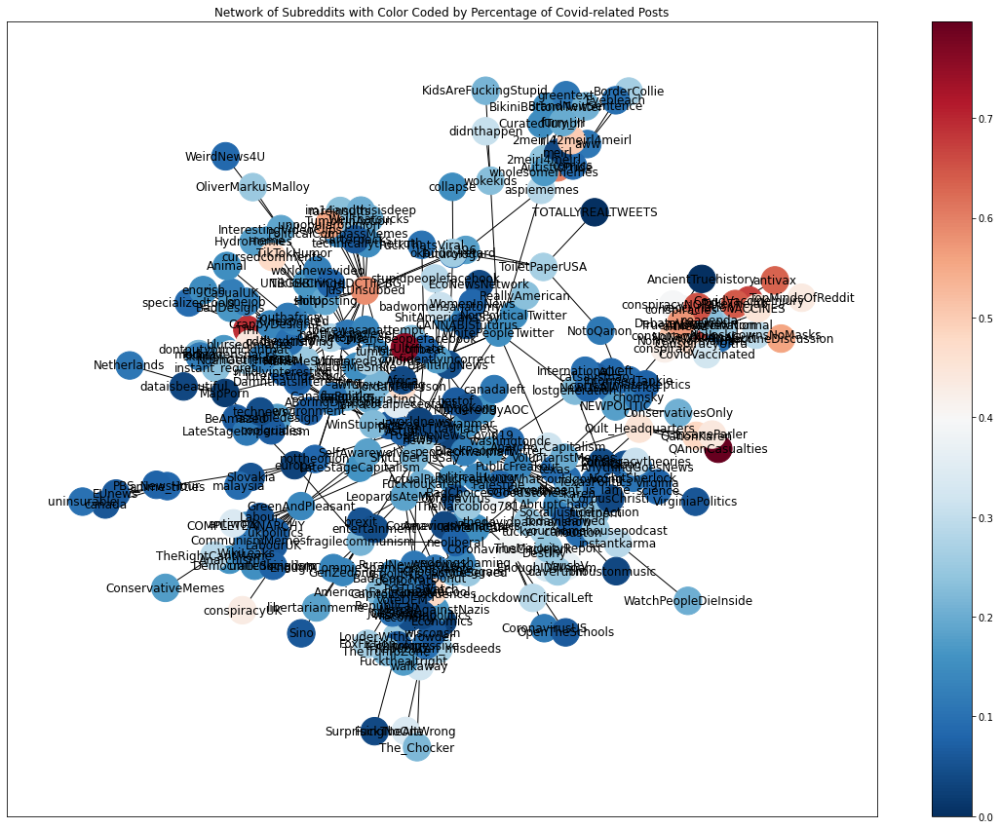

In [203]:
plt.figure(figsize=(20, 15))
ATTRIBUTE_NAME = 'anti_vac'
COLOR_SCHEME = "RdBu_r" # try plt.cm.Blues if your attribute is a continuous variable
Gcc5 = G5.subgraph(sorted(nx.connected_components(G5), key=len, reverse=True)[0])
colors = [Gcc5.nodes[node][ATTRIBUTE_NAME] for node in list(Gcc5.nodes())]
pos = nx.spring_layout(Gcc5, seed=10396953)
# nx.draw_networkx_nodes(Gcc, pos, node_size=10, node_color=colors, cmap=COLOR_SCHEME, label=Gcc.nodes())
# nx.draw_networkx_edges(Gcc, pos, alpha=0.4)
nx.draw_networkx(Gcc5, pos, node_color=colors, node_size=800, cmap=COLOR_SCHEME)
ax=plt.gca()
PCM=ax.get_children()[0] # this index may vary
plt.colorbar(PCM, ax=ax)
plt.title("Network of Subreddits with Color Coded by Percentage of Covid-related Posts")

Text(0.5, 1.0, 'Network of Subreddits with Color Coded by Percentage of Covid-related Posts')

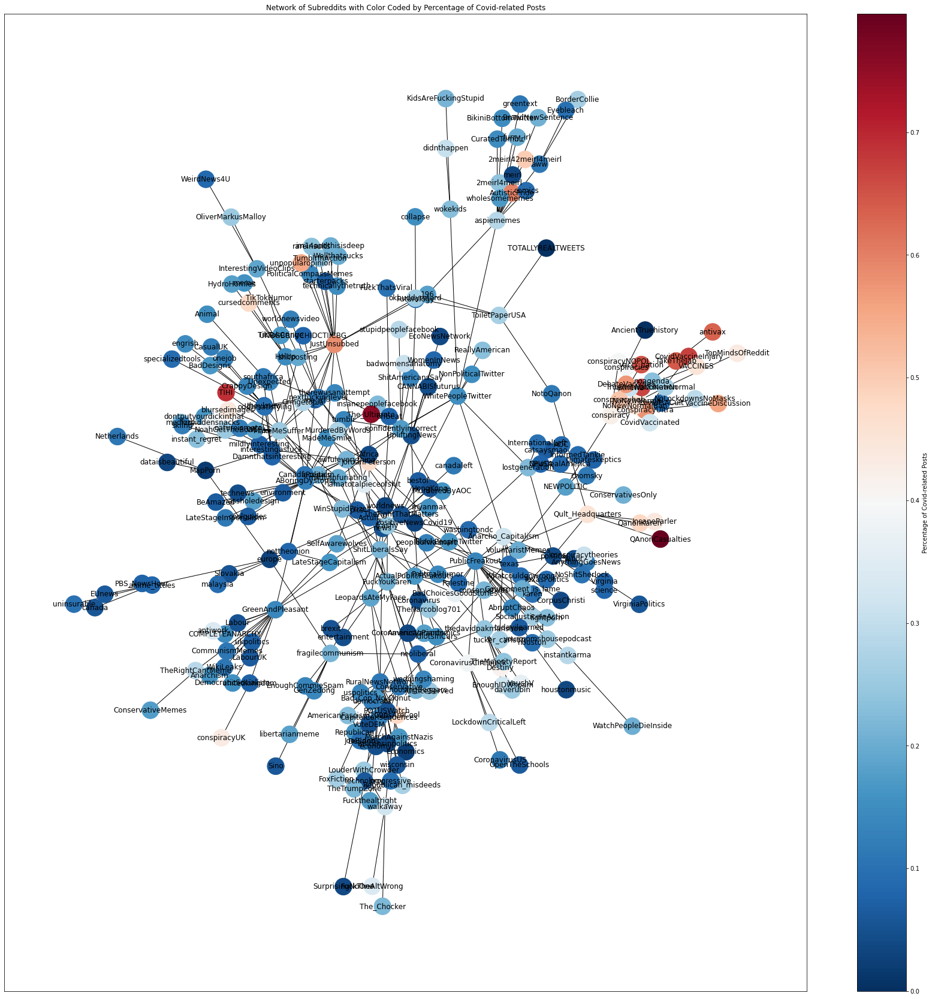

In [200]:
plt.figure(figsize=(30, 30))
ATTRIBUTE_NAME = 'anti_vac'
COLOR_SCHEME = "RdBu_r" # try plt.cm.Blues if your attribute is a continuous variable
Gcc5 = G5.subgraph(sorted(nx.connected_components(G5), key=len, reverse=True)[0])
colors = [Gcc5.nodes[node][ATTRIBUTE_NAME] for node in list(Gcc5.nodes())]
pos = nx.spring_layout(Gcc5, seed=10396953)
# nx.draw_networkx_nodes(Gcc, pos, node_size=10, node_color=colors, cmap=COLOR_SCHEME, label=Gcc.nodes())
# nx.draw_networkx_edges(Gcc, pos, alpha=0.4)
nx.draw_networkx(Gcc5, pos, node_color=colors, node_size=800, cmap=COLOR_SCHEME)
ax=plt.gca()
PCM=ax.get_children()[0] # this index may vary
plt.colorbar(PCM, ax=ax, label='Percentage of Covid-related Posts')
plt.title("Network of Subreddits with Color Coded by Percentage of Covid-related Posts")

Text(0.5, 1.0, 'Network of Subreddits with Color Coded by Percentage of Covid-related Posts')

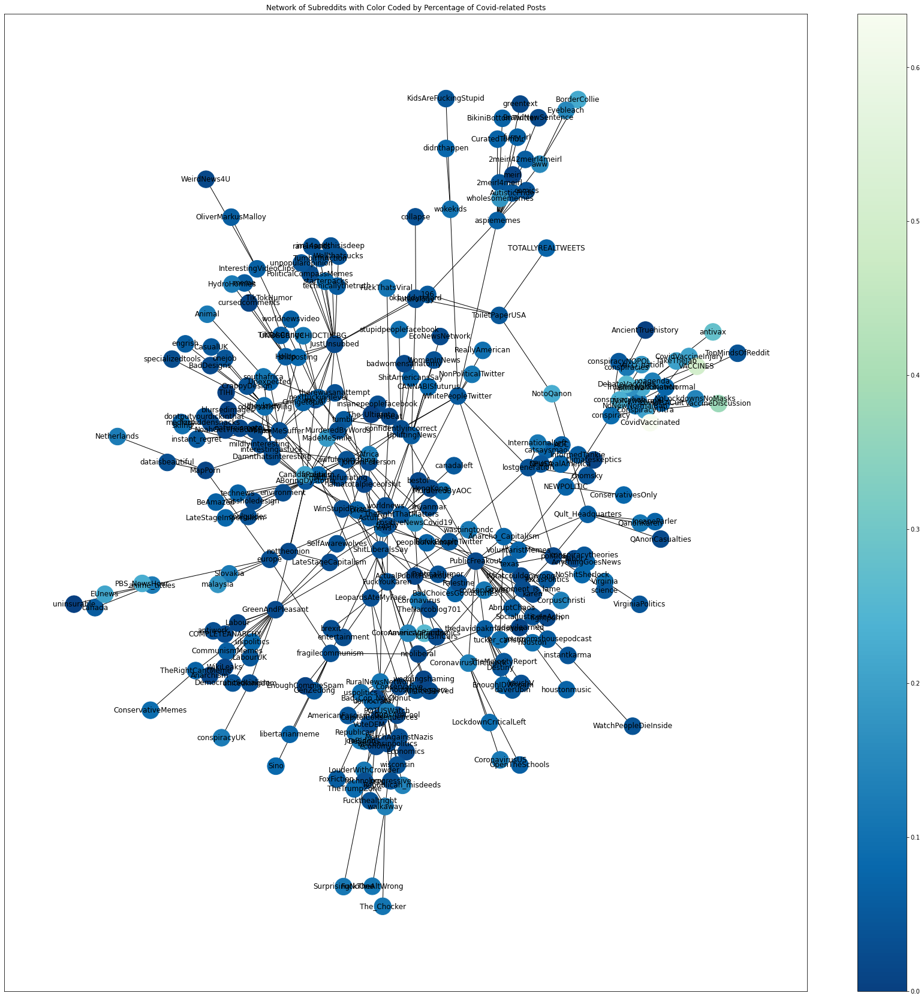

In [90]:
plt.figure(figsize=(30, 30))
ATTRIBUTE_NAME = 'pro_vac'
COLOR_SCHEME = "GnBu_r" # try plt.cm.Blues if your attribute is a continuous variable
Gcc5 = G5.subgraph(sorted(nx.connected_components(G5), key=len, reverse=True)[0])
colors = [Gcc5.nodes[node][ATTRIBUTE_NAME] for node in list(Gcc5.nodes())]
pos = nx.spring_layout(Gcc5, seed=10396953)
# nx.draw_networkx_nodes(Gcc, pos, node_size=10, node_color=colors, cmap=COLOR_SCHEME, label=Gcc.nodes())
# nx.draw_networkx_edges(Gcc, pos, alpha=0.4)
nx.draw_networkx(Gcc5, pos, node_color=colors, node_size=800, cmap=COLOR_SCHEME)
ax=plt.gca()
PCM=ax.get_children()[0] # this index may vary
plt.colorbar(PCM, ax=ax)
plt.title("Network of Subreddits with Color Coded by Percentage of Covid-related Posts")

In [95]:
posts2.sort_values(by="p_an_ratio",ascending=False).head(10)

,subreddit,posts,posts_anti,posts_neutral,posts_pro,authors,p_an_ratio,p_pr_ratio,p_ne_ratio
225,QAnonCasualties,8029,6396,1463,170,6096,0.796612,0.021173,0.182214
18,The_Ultimate,78,59,19,0,2,0.756410,0.000000,0.243590
223,TIHI,4346,2999,1328,19,3833,0.690060,0.004372,0.305568
21,CovidVaccineInjury,632,423,79,130,111,0.669304,0.205696,0.125000
57,TrueAntiVaccination,2721,1819,301,601,350,0.668504,0.220875,0.110621
35,vacci_nation,1269,828,214,227,78,0.652482,0.178881,0.168637
58,TakeTheJab,2977,1912,471,594,340,0.642257,0.199530,0.158213
64,antivax,2480,1574,214,692,1840,0.634677,0.279032,0.086290
110,AutisticPride,1304,779,455,70,929,0.597393,0.053681,0.348926
166,JustUnsubbed,1207,705,479,23,1055,0.584093,0.019056,0.396852


In [96]:
posts2.sort_values(by="p_pr_ratio",ascending=False).head(10)

,subreddit,posts,posts_anti,posts_neutral,posts_pro,authors,p_an_ratio,p_pr_ratio,p_ne_ratio
197,CovidVaccinated,24113,7771,1036,15306,17022,0.322274,0.634761,0.042964
71,VACCINES,3755,1691,183,1881,2965,0.450333,0.500932,0.048735
52,VaccineDiscussion,1816,1008,126,682,1105,0.555066,0.375551,0.069383
64,antivax,2480,1574,214,692,1840,0.634677,0.279032,0.086290
142,DebateVaccines,13420,7700,2264,3456,2523,0.573770,0.257526,0.168703
13,AmericanPandemics,434,78,245,111,5,0.179724,0.255760,0.564516
20,conspiracyhub,410,208,107,95,17,0.507317,0.231707,0.260976
15,NotoQanon,79,9,52,18,3,0.113924,0.227848,0.658228
72,PBS_NewsHour,1474,111,1030,333,3,0.075305,0.225916,0.698779
57,TrueAntiVaccination,2721,1819,301,601,350,0.668504,0.220875,0.110621


In [97]:
posts2.sort_values(by="p_ne_ratio",ascending=False).head(10)

,subreddit,posts,posts_anti,posts_neutral,posts_pro,authors,p_an_ratio,p_pr_ratio,p_ne_ratio
12,AncientTruehistory,22,0,22,0,5,0.000000,0.000000,1.000000
129,CityPorn,2268,6,2243,19,1535,0.002646,0.008377,0.988977
202,MapPorn,8603,140,8367,96,5217,0.016273,0.011159,0.972568
158,meirl,971,36,930,5,810,0.037075,0.005149,0.957775
150,Economics,10078,248,9640,190,4106,0.024608,0.018853,0.956539
22,wisconsinpolitics,256,9,242,5,98,0.035156,0.019531,0.945312
279,politics,235282,9626,222118,3538,55207,0.040913,0.015037,0.944050
280,worldnews,311135,9136,292760,9239,51093,0.029363,0.029695,0.940942
106,EcoNewsNetwork,1130,45,1060,25,19,0.039823,0.022124,0.938053
259,europe,64471,1921,60382,2168,22643,0.029796,0.033628,0.936576


In [ ]:
len()

# LEGACY

In [4]:
import matplotlib.pyplot as plt
plt.figure(figsize=(320, 180)) 

nx.draw(G4, pos=nx.spring_layout(G4), node_color='r', edge_color='b', node_size=3, with_labels=True,)

In [11]:
posts['p_pr_ratio'] = posts['posts_pro'] / posts['posts']

In [14]:
posts['p_an_ratio'] = posts['posts_anti'] / posts['posts']
posts['p_ne_ratio'] = posts['posts_neutral'] / posts['posts']

In [15]:
posts.head()

,Unnamed: 0,posts,posts_anti,posts_neutral,posts_pro,authors,p_pr_ratio,p_an_ratio,p_ne_ratio
0,altnewz,3651,428,3024,199,169,0.054506,0.117228,0.828266
1,CovidIsACult,115,15,93,7,6,0.060870,0.130435,0.808696
2,didnthappen,204,47,148,9,49,0.044118,0.230392,0.725490
3,OpenTheSchools,39,6,32,1,12,0.025641,0.153846,0.820513
4,punnychalkboards,258,23,220,15,31,0.058140,0.089147,0.852713


(array([141., 103.,  16.,   7.,   7.,   6.,   2.,   2.,   1.,   0.,   0.,
          1.,   0.,   0.,   0.,   1.,   0.,   0.,   0.,   1.]),
 array([0.        , 0.02914187, 0.05828375, 0.08742562, 0.11656749,
        0.14570937, 0.17485124, 0.20399311, 0.23313499, 0.26227686,
        0.29141873, 0.32056061, 0.34970248, 0.37884435, 0.40798623,
        0.4371281 , 0.46626997, 0.49541185, 0.52455372, 0.5536956 ,
        0.58283747]),
 <BarContainer object of 20 artists>)

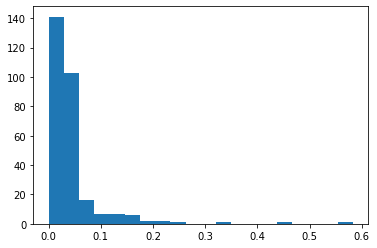

In [16]:
plt.hist(posts['p_pr_ratio'], bins = 20)

(array([25., 52., 40., 45., 47., 24., 12., 15.,  3.,  3.,  2.,  3.,  4.,
         3.,  6.,  0.,  2.,  1.,  0.,  1.]),
 array([0.00322358, 0.03888888, 0.07455417, 0.11021946, 0.14588475,
        0.18155004, 0.21721533, 0.25288063, 0.28854592, 0.32421121,
        0.3598765 , 0.39554179, 0.43120708, 0.46687238, 0.50253767,
        0.53820296, 0.57386825, 0.60953354, 0.64519883, 0.68086413,
        0.71652942]),
 <BarContainer object of 20 artists>)

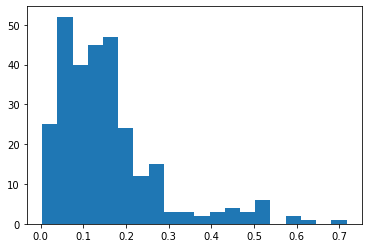

In [17]:
plt.hist(posts['p_an_ratio'], bins = 20)

(array([ 2.,  1.,  0.,  1.,  2.,  4.,  3.,  1.,  0.,  6.,  3.,  6.,  4.,
        17., 22., 47., 50., 53., 47., 19.]),
 array([0.09195015, 0.13683053, 0.18171092, 0.2265913 , 0.27147168,
        0.31635206, 0.36123244, 0.40611283, 0.45099321, 0.49587359,
        0.54075397, 0.58563435, 0.63051473, 0.67539512, 0.7202755 ,
        0.76515588, 0.81003626, 0.85491664, 0.89979703, 0.94467741,
        0.98955779]),
 <BarContainer object of 20 artists>)

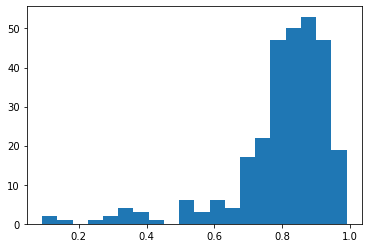

In [18]:
plt.hist(posts['p_ne_ratio'], bins = 20)

In [11]:
import matplotlib.pyplot as plt
plt.figure(figsize=(320, 180)) 

nx.draw(G4, pos=nx.spring_layout(G4), node_color='r', edge_color='b', node_size=3, with_labels=True,)

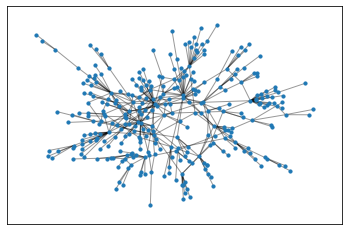

In [19]:
Gcc = G4.subgraph(sorted(nx.connected_components(G4), key=len, reverse=True)[0])
pos = nx.spring_layout(Gcc, seed=10396953)
nx.draw_networkx_nodes(Gcc, pos, node_size=10)
nx.draw_networkx_edges(Gcc, pos, alpha=0.4)

In [24]:
anti_dict = pd.Series(posts['p_an_ratio'].values, index=posts.subreddit).to_dict()

In [25]:
pro_dict = pd.Series(posts['p_pr_ratio'].values, index=posts.subreddit).to_dict()

In [26]:
neutr_dict = pd.Series(posts['p_ne_ratio'].values, index=posts.subreddit).to_dict()

In [27]:
nx.set_node_attributes(G4, anti_dict, 'anti_vac')

In [28]:
nx.set_node_attributes(G4, pro_dict, 'pro_vac')

In [29]:
nx.set_node_attributes(G4, neutr_dict, 'neutr_vac')

In [30]:
len(Gcc.nodes())

313

In [31]:
nodelist = list(G4.nodes())

In [32]:
for node in nodelist:
    if node not in anti_dict:
        G4.remove_node(node)

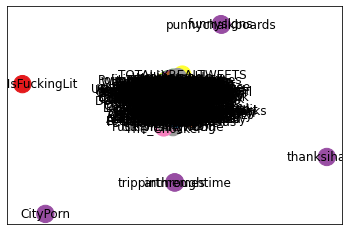

In [22]:
ATTRIBUTE_NAME = 'anti_vac'
COLOR_SCHEME = "Set1" # try plt.cm.Blues if your attribute is a continuous variable
colors = [G4.nodes[node][ATTRIBUTE_NAME] for node in list(G4.nodes())]
nx.draw_networkx(G4, node_color=colors, cmap=COLOR_SCHEME)

'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'winter', 'winter_r'

In [33]:
G4.is_directed()

False

Text(0.5, 1.0, 'Network of Subreddits with Color Coded by Percentage of Pro Vaccine Posts')

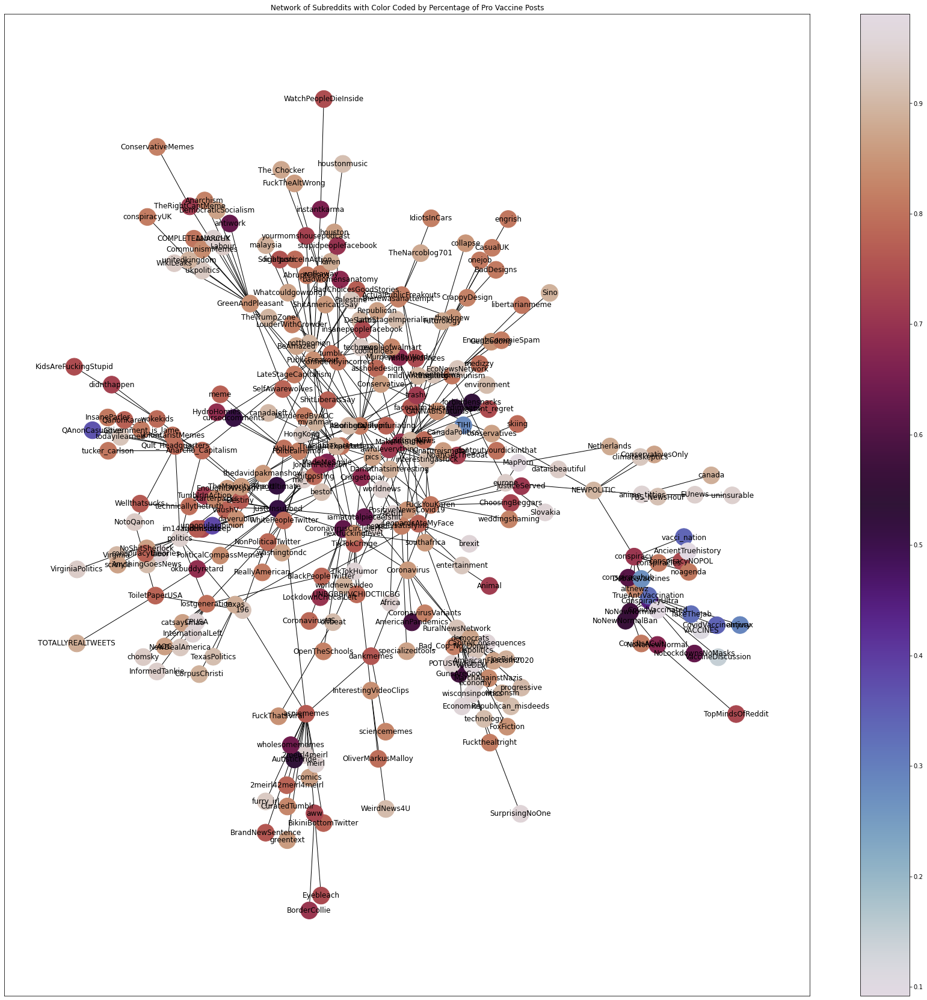

In [38]:
plt.figure(figsize=(30, 30))
ATTRIBUTE_NAME = 'neutr_vac'
COLOR_SCHEME = "twilight" # try plt.cm.Blues if your attribute is a continuous variable
Gcc = G4.subgraph(sorted(nx.connected_components(G4), key=len, reverse=True)[0])
colors = [Gcc.nodes[node][ATTRIBUTE_NAME] for node in list(Gcc.nodes())]
pos = nx.spring_layout(Gcc, seed=10396953)
# nx.draw_networkx_nodes(Gcc, pos, node_size=10, node_color=colors, cmap=COLOR_SCHEME, label=Gcc.nodes())
# nx.draw_networkx_edges(Gcc, pos, alpha=0.4)
nx.draw_networkx(Gcc, pos, node_color=colors, node_size=800, cmap=COLOR_SCHEME)
ax=plt.gca()
PCM=ax.get_children()[0] # this index may vary
plt.colorbar(PCM, ax=ax)
plt.title("Network of Subreddits with Color Coded by Percentage of Pro Vaccine Posts")

In [39]:
nw.visualize(Gcc)

({'xlim': [0, 754],
  'ylim': [0, 754],
  'linkColor': '#7c7c7c',
  'linkAlpha': 0.5,
  'nodeStrokeColor': '#555555',
  'nodeStrokeWidth': 0.7674035989717224,
  'links': [{'source': 'dankmemes',
    'target': 'FuckYouKaren',
    'width': 0.26164788465439415,
    'weight': 22},
   {'source': 'dankmemes',
    'target': 'aspiememes',
    'width': 0.40992345401763364,
    'weight': 54},
   {'source': 'dankmemes',
    'target': 'sciencememes',
    'width': 0.2789175822062348,
    'weight': 25},
   {'source': 'FuckYouKaren',
    'target': 'ChoosingBeggars',
    'width': 0.2366694165242219,
    'weight': 18},
   {'source': 'FuckYouKaren',
    'target': 'JusticeServed',
    'width': 0.21604863016983714,
    'weight': 15},
   {'source': 'FuckYouKaren',
    'target': 'iamatotalpieceofshit',
    'width': 0.3105894748749174,
    'weight': 31},
   {'source': 'FuckYouKaren',
    'target': 'mildlyinfuriating',
    'width': 0.24947146957321073,
    'weight': 20},
   {'source': 'FuckYouKaren',
    'tar